## 01. 우리나라 지도 호출

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=seoul&zoom=11&size=640x640&scale=2&maptype=hybrid&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=seoul&sensor=false


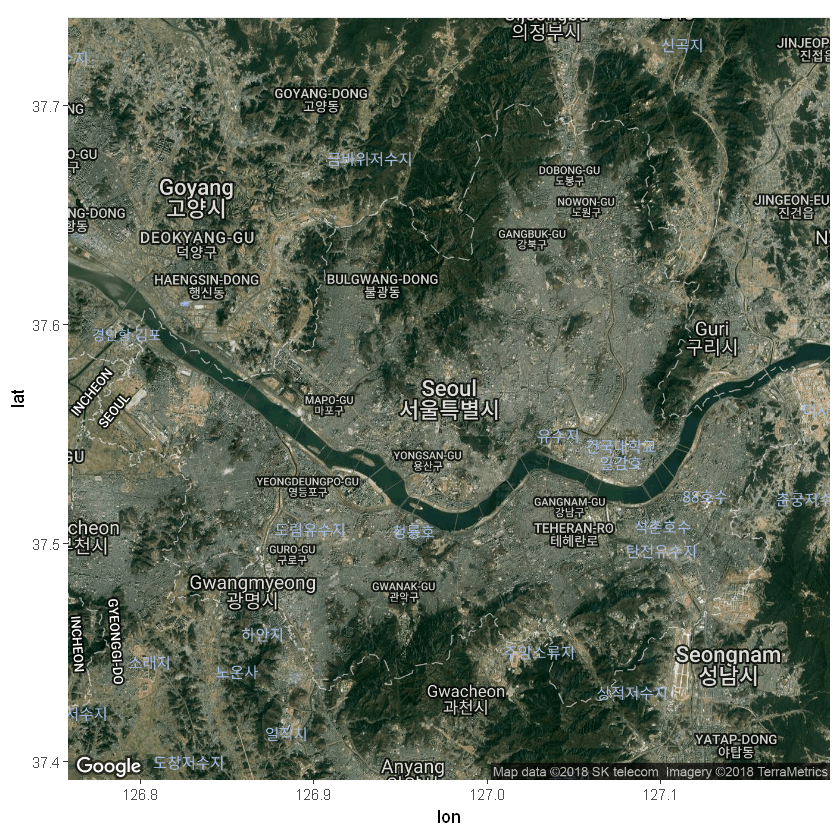

In [4]:
getmap <- get_googlemap("seoul", zoom=11, maptype = "hybrid")
ggmap(getmap)

## 02. 서울시 구청 위치 확인

In [7]:
setwd("D:\\dataset\\RLoveYou")
library(grDevices)
library(ggmap)

### get_map
#### get_map은 Google지도, OpenStreetMap, Stamen Maps 또는 Naver Map 서버에지도를 쿼리하는 스마트 래퍼입니다.
<pre>
get_map(location = c(lon = -95.3632715, lat = 29.7632836), 
      zoom = "auto",    
      scale = "auto", 
      maptype = c("terrain", "terrain-background", "satellite", "roadmap", "hybrid", "toner", "watercolor", "terrain-labels", "terrain-lines", "toner-2010", "toner-2011", "toner-background", "toner-hybrid", "toner-labels", "toner-lines", "toner-lite"), 
      source = c("google", "osm", "stamen", "cloudmade"), 
      force = ifelse(source == "google", TRUE, TRUE), 
      messaging = FALSE, 
      urlonly = FALSE, 
      filename = "ggmapTemp", 
      crop = TRUE, 
      color = c("color", "bw"), 
      language = "en-EN", api_key)
      
      
zoom : 3~21, default = 10
color: ("color") or black-and-white ("bw")
</pre>
### 상세 정보는 URL 참조

https://www.rdocumentation.org/packages/ggmap/versions/2.6.1/topics/get_map

name,LAT,LON,LATLON
서울시청,37.56437,126.9756,37.56437:126.9756
강남구청,37.51729,127.0474,37.51729:127.0474
강북구청,37.63978,127.0255,37.63978:127.0255
강서구청,37.55601,126.8493,37.556009:126.849274
강동구청,37.52996,127.1235,37.52996:127.1235
관악구청,37.47813,126.9515,37.47813:126.9515
광진구청,37.53796,127.0821,37.53796:127.0821
구로구청,37.49546,126.8875,37.49546:126.8875
금천구청,37.45691,126.8954,37.45691:126.8954
노원구청,37.65411,127.0563,37.65411:127.0563


Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=seoul&zoom=11&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=seoul&sensor=false


Saving 6.67 x 6.67 in image


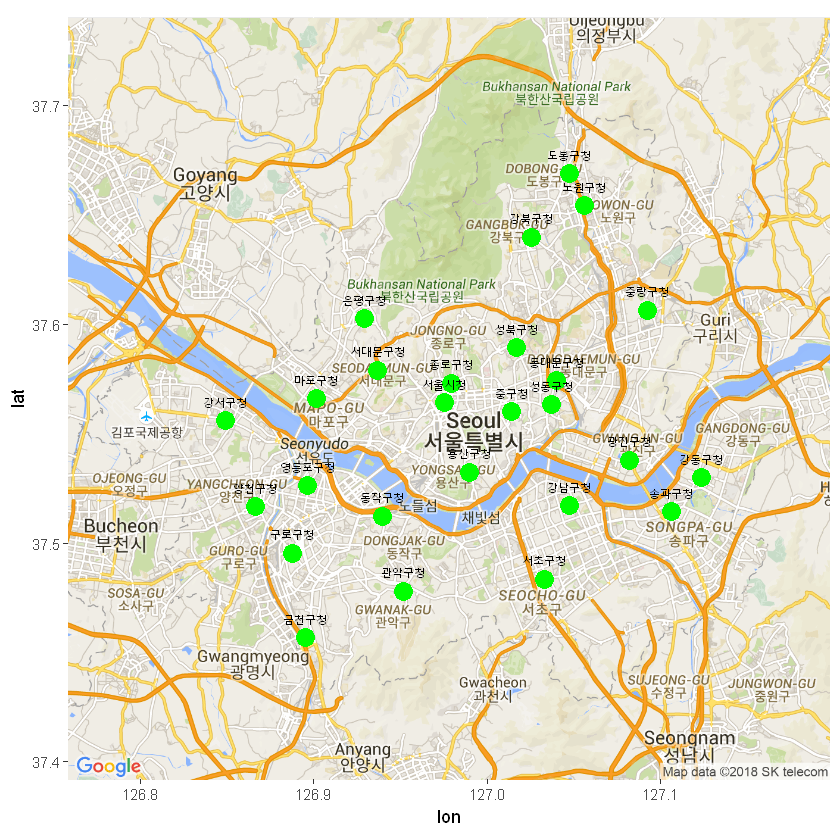

In [8]:
df <- read.csv("서울시구청위치정보_new.csv",header=T)
df

map <- get_map("seoul", zoom=11, maptype = "roadmap")

gu.map <- ggmap(map) + 
          geom_point(data=df, 
                     aes(x=LON, y=LAT),size=5,
                     alpha=1,color="green")

gu.map + geom_text(data=df, aes(x = LON, y = LAT+0.01, label=name),size=3)
ggsave("goffice.png",dpi=500)

## 실습 01
<pre>
maptype을 다르게 해서 표시해 보자.
</pre>

## 03. 서울 지하철 2호선 표시
<pre>
zoom을 조정하는 것에 따라 약간의 missing value가 보인다.
</pre>

역명,LON,LAT
시청역,126.9759,37.56383
을지로 입구역,126.9826,37.56656
을지로 3가역,126.9926,37.56688
을지로 4가역,126.9976,37.56719
동대문 운동장역,127.0092,37.56564
신당 역,127.0194,37.56616


[1] 126.98939  37.52908

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=37.529084,126.989387&zoom=12&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Warning message:
"Removed 4 rows containing missing values (geom_point)."Warning message:
"Removed 4 rows containing missing values (geom_text)."

Saving 6.67 x 6.67 in image
Warning message:
"Removed 4 rows containing missing values (geom_point)."Warning message:
"Removed 4 rows containing missing values (geom_text)."

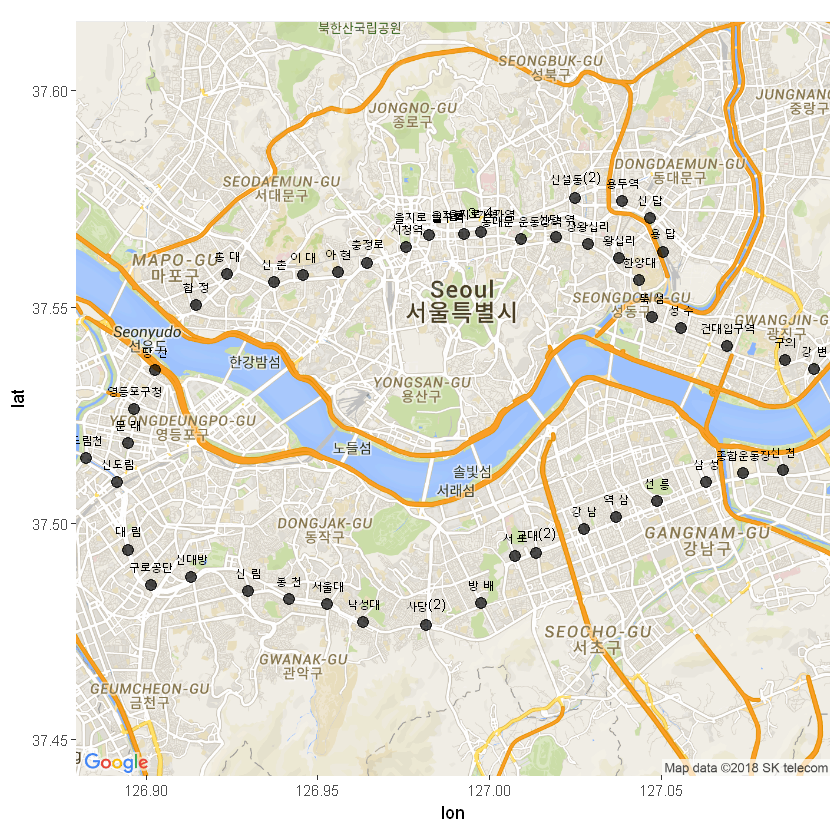

In [12]:
library(ggplot2)
library(ggmap)
loc <- read.csv("서울지하철2호선위경도정보.csv",header=T)
head(loc)
center <- c(mean(loc$LON), mean(loc$LAT))   # 지도의 중심위치 정하기 
head(center)
kor <- get_map(center, zoom=12, maptype = "roadmap")

kor.map <- ggmap(kor)+geom_point(data=loc, aes(x=LON, y=LAT),size=3,alpha=0.7)
kor.map + geom_text(data=loc, aes(x = LON, y = LAT+0.005, label=역명),size=3)
ggsave("line2.png",dpi=500)

## 실습 02
<pre>
서울시장난감도서관위치현황.csv 데이터 셋을 이용하여 지도위에 정보를 표시해 보자.
</pre>

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=seoul&zoom=11&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=seoul&sensor=false
Warning message:
"Removed 1 rows containing missing values (geom_point)."Warning message:
"Removed 1 rows containing missing values (geom_text)."

Saving 6.67 x 6.67 in image
Warning message:
"Removed 1 rows containing missing values (geom_point)."Warning message:
"Removed 1 rows containing missing values (geom_text)."

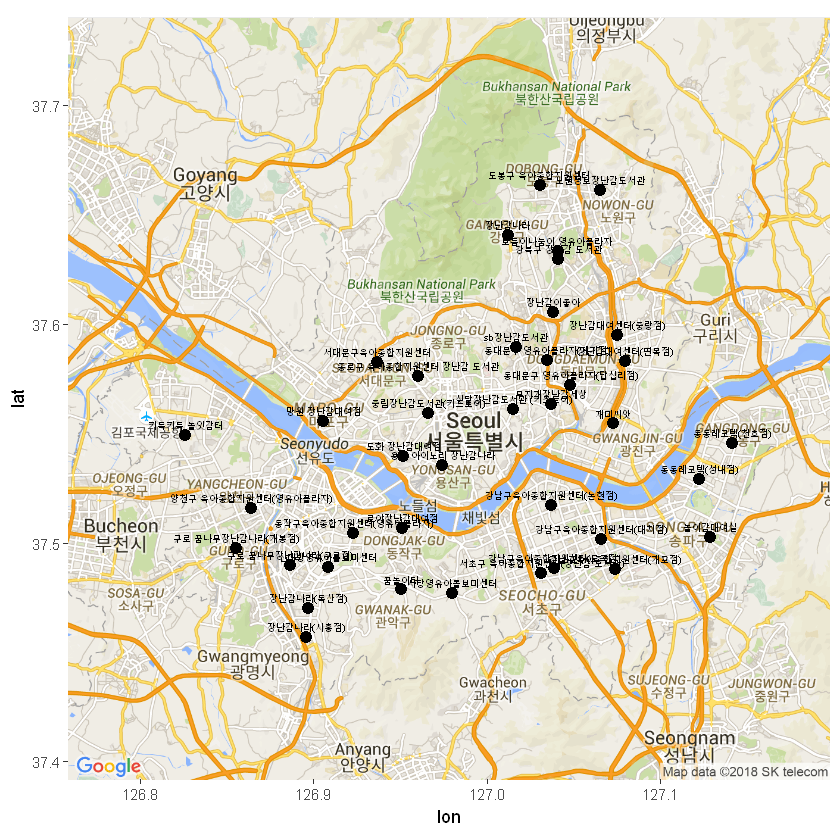

## 04. 한 지도위에 두 위치 정보 표시
<pre>
지역별장애인도서관정보
서울시장난감도서관위치현황
kor.map = ggmap(map1) + geom_point() + geom_point()
</pre>

In [20]:
loc1 <- read.csv("지역별장애인도서관정보.csv",header=T)
head(loc1,1)
loc2 <- read.csv("서울시장난감도서관위치현황.csv",header=T)
head(loc2,1)
map1 <- get_map("seoul", zoom=11, maptype = "roadmap")
kor.map <- ggmap(map1) + 
           geom_point(data=loc1, aes(x=LON, y=LAT),color="red", size=4,alpha=0.7) + 
           geom_point(data=loc2, aes(x=LON, y=LAT),color="green",size=4,alpha=1)
          
kor.map + geom_text(data=loc1, aes(x = LON, y = LAT+0.01, label=자치구명),size=3)
savePlot("doublemap.png",type="png")


도서관코드,도서관명,자치구코드,자치구명,주소,전화번호,홈페이지,도서관구분,LAT,LON
74,하상시각장애인도서관,8,강남구,서울 강남구 개포동 12-5 하상장애인복지회관,02-451-6000,http://onsori.or.kr,장애인도서관,37.49251,127.0751


연번,기관명,이름,시,구,도로명,도로명.번호,건물번호,기타,도로명주소,전화번호,홈페이지,우편번호,LAT,LON,지번주소,지번주소주소데이터.URI,주소데이터.HTML.페이지
1,종로구,종로구 육아종합지원센터 장난감 도서관,서울특별시,종로구,통일로,18길,64,,종로구 통일로 18길 64(무악동79번지),735-0890,http://www.jnccic.or.kr,110-080,37.57605,126.9603,서울특별시 종로구 무악동 79 (무악어린이집),http://jusodata.kr/resource/1111018700100790000000htt,http://jusodata.kr/main/ir/detail.jsp?uri=http://jhttp://jusodata.kr/main/ir/detail.jsp?uri=htt


Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=seoul&zoom=11&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=seoul&sensor=false
Warning message:
"geocode failed with status OVER_QUERY_LIMIT, location = "seoul""

ERROR: Error in data.frame(ll.lat = ll[1], ll.lon = ll[2], ur.lat = ur[1], ur.lon = ur[2]): arguments imply differing number of rows: 0, 1


In [21]:
library(ggmap)

loc <- read.csv("서울지하철2호선위경도정보.csv",header=T)
loc2 <- read.csv("서울지하철3호선역위경도정보.csv",header=T)
lab_name <- c("2호선","3호선")
lab_color <- c("green","red")
center <- c(mean(loc2$LON)-0.03, mean(loc2$LAT))
kor <- get_map(center, zoom=11, maptype = "roadmap")

png(filename = "lineplus_2.png", width = 480, height = 480)

kor.map <- ggmap(kor)+geom_point(data=loc, aes(x=LON, y=LAT),size=3,color="green")+
                      geom_point(data=loc2,aes(x=LON, y=LAT),size=3,color="red")
kor.map + geom_text(data=loc, aes(x = LON, y = LAT+0.005, label=역명),size=3) +
          geom_text(data=loc2, aes(x = LON, y = LAT+0.005, label=역명),size=3 ) 

dev.off()

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=37.563651,126.939553&zoom=11&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false


png 
  2

## 05. 지도위에 경로를 표시해보기
<pre>
kor.map + geom_path( ) + geom_text( )
</pre>

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=seodaemun+gu&zoom=11&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=seodaemun%20gu&sensor=false


Saving 6.67 x 6.67 in image


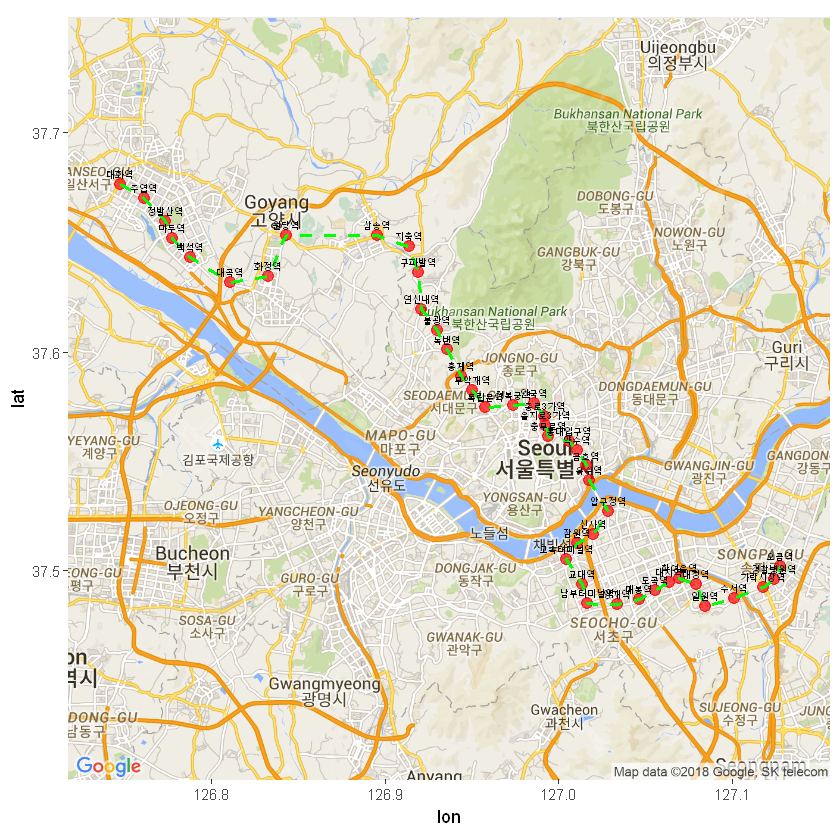

In [11]:
loc <- read.csv("서울지하철3호선역위경도정보.csv",header=T)
kor <- get_map("seodaemun gu", zoom=11, maptype = "roadmap")

kor.map <- ggmap(kor)+ geom_point(data=loc, aes(x=LON, y=LAT),
                                  size=3,alpha=0.7,col="red")

kor.map + geom_path(data=loc,aes(x=LON,y=LAT),size=1,linetype=2,col="green")+
          geom_text(data=loc, aes(x = LON, y = LAT+0.005, label=역명),size=2)

ggsave("line_3.png",dpi=600)

## 06. 지도위에 인구수를 표시해보자
<pre>
map1 + geom_point(aes(x=lon, y=lat, colour=data, size=data), data=df)
</pre>

지역,총인구수,남자인구수,여자인구수,LAT,LON
서울특별시,10137313,5002036,5135277,37.54100,126.9860
부산광역시,3523386,1743807,1779579,35.18376,129.0755
대구광역시,2499880,1244520,1255360,35.87145,128.6014
인천광역시,2889258,1453139,1436119,37.45622,126.7052
광주광역시,1471850,729480,742370,35.16008,126.8515
대전광역시,1535367,768425,766942,36.35042,127.3845


lon,lat,data
126.9860,37.54100,10137313
129.0755,35.18376,3523386


Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=Jeonju&zoom=7&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=Jeonju&sensor=false


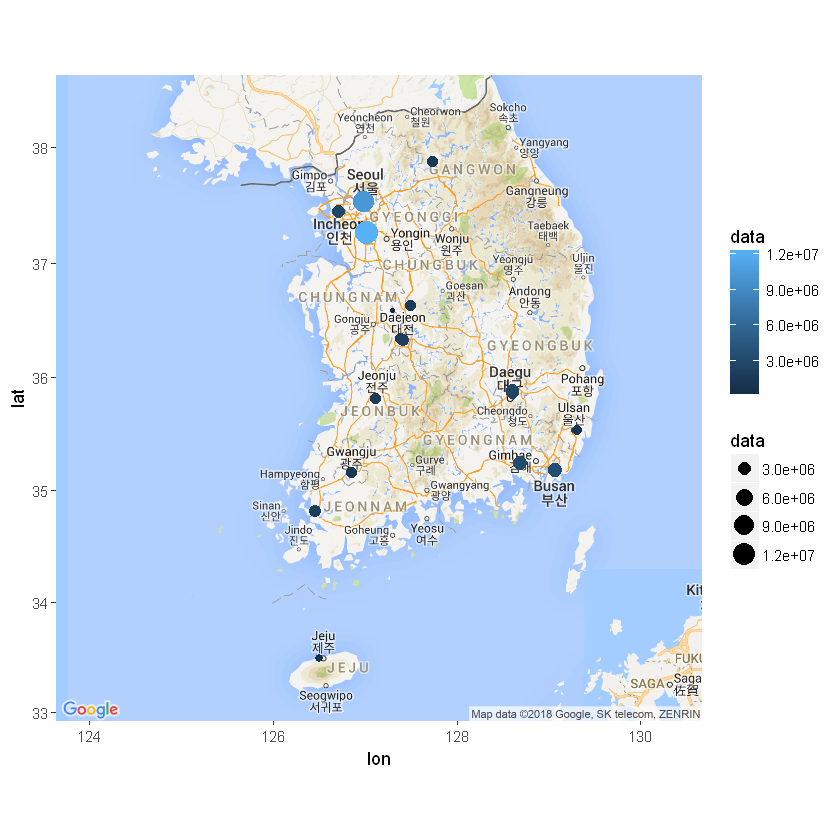

In [24]:
pop <- read.csv("지역별인구현황_2014_4월기준.csv",header=T)
head(pop)
lon <- pop$LON
lat <- pop$LAT
data <- pop$총인구수
df <- data.frame(lon,lat,data)
head(df,2)
map1 <- get_map("Jeonju",zoom=7 , maptype='roadmap')
map1 <- ggmap(map1)
map1 + geom_point(aes(x=lon,y=lat,colour=data,size=data),data=df)
ggsave("pop.png",scale=1,width=7,height=4,dpi=1000)

## 실습 maptype = hybrid, terrain를 표시해보자.

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=Jeonju&zoom=7&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=Jeonju&sensor=false


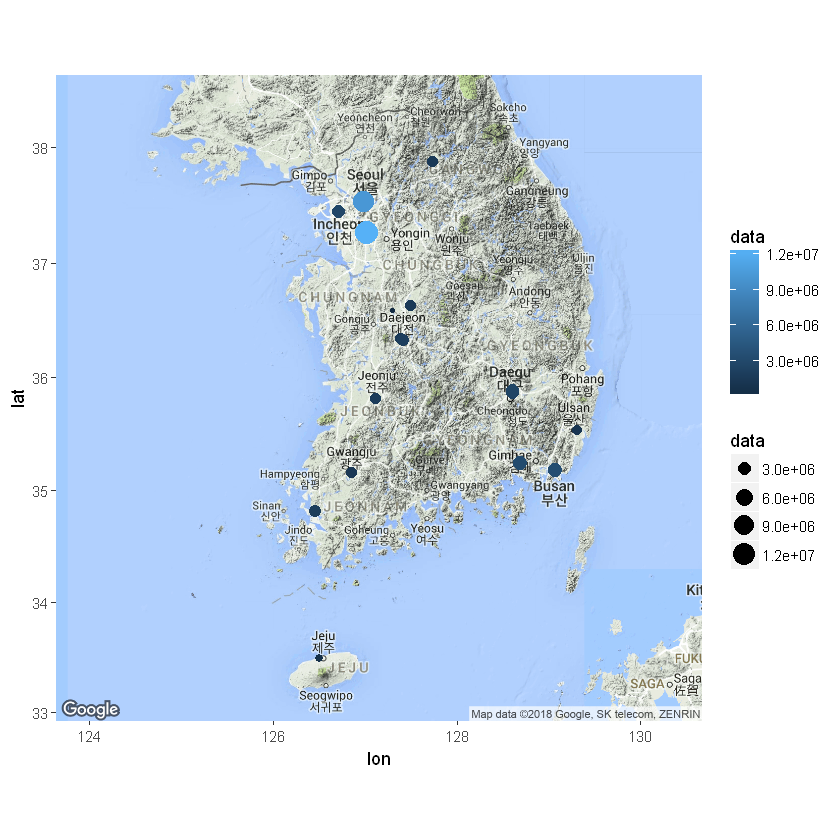

In [27]:
map2 <- get_map("Jeonju",zoom=7 , maptype='terrain')
map2 <- ggmap(map2)
map2 + geom_point(aes(x=lon,y=lat,colour=data,size=data),data=df)
ggsave("pop2.png",scale=1,width=7,height=4,dpi=1000)

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=Jeonju&zoom=7&size=640x640&scale=2&maptype=hybrid&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=Jeonju&sensor=false


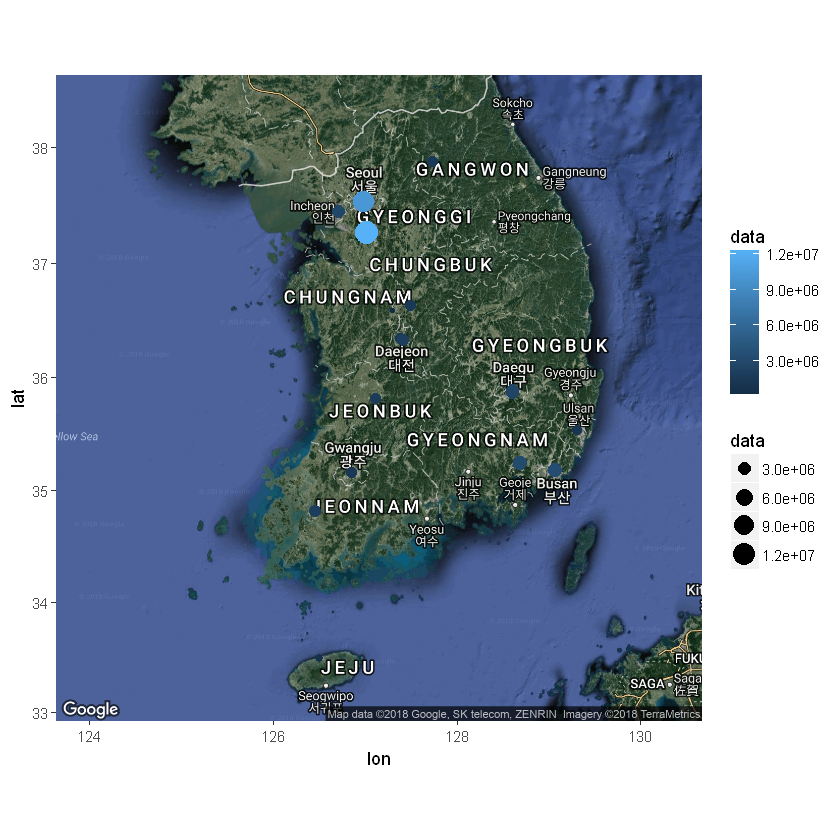

In [31]:
map4 <- get_map("Jeonju",zoom=7 , maptype='hybrid')
map4 <- ggmap(map4)
map4 + geom_point(aes(x=lon,y=lat,colour=data,size=data),data=df)
ggsave("pop4.png",scale=1,width=7,height=4,dpi=700)

### fill을 factor(data) 로 해보기

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=Jeonju&zoom=7&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=Jeonju&sensor=false


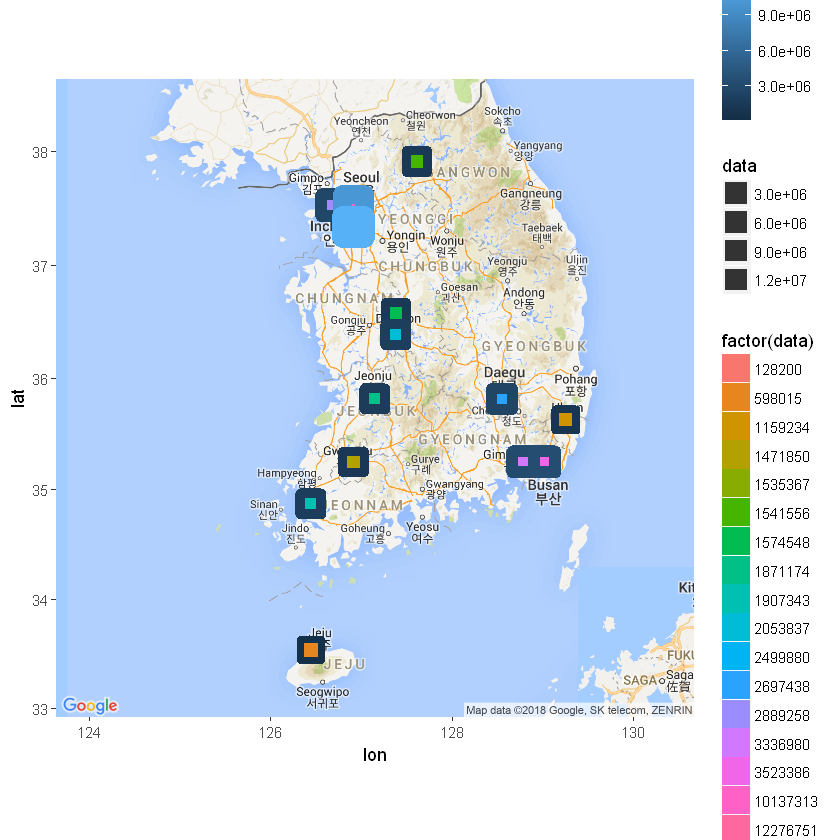

In [32]:
map5 <- get_map("Jeonju",zoom=7 , maptype='roadmap')
map5 <- ggmap(map5)
map5 + stat_bin2d(aes(x=lon,y=lat,colour=data,fill=factor(data),size=data),data=df)
ggsave("pop5.png",scale=2,width=7,height=4,dpi=700)

In [14]:
# install.packages("RgoogleMaps")
library(RgoogleMaps)

ERROR: Error in savePlot("map_pop.png", type = "png"): can only copy from 'windows' devices


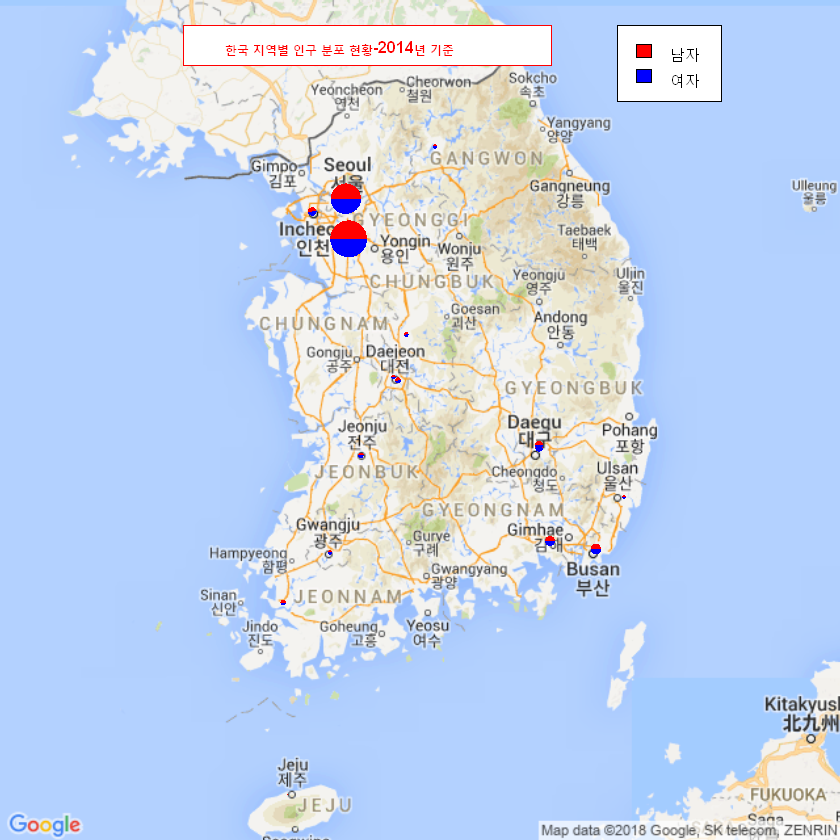

In [15]:
# 지도위에 파이챠트를 그리기 위해 사용자정의 함수를 생성합니다.
 PieOnStaticMap <- 
 function(x, lat, lon, 
 maptype=c("roadmap","satellite", "terrain", "hybrid")[4],
 edges=200, clockwise=FALSE, init.angle=if (clockwise) 90 else 0,
 col=NULL, alpha=0.6, title=NULL)
 {
  
 filename <- "tmp.png" ## 지도 파일 다운로드 받아서 저장할 때 사용할 파일이름
 center <- c(mean(lat), mean(lon))  ## 지도의 가운데 지점 설정
 zoom <- min(MaxZoom(range(lat), range(lon)),15) ## 줌 비율 지정
 
 MyMap <- GetMap(center=center, zoom=zoom, maptype=maptype, destfile=filename) 
 tmp <- PlotOnStaticMap(MyMap, lat=lat, lon=lon, type="n", add=F)
  
 locs=LatLon2XY.centered(MyMap, lat, lon)
 
 # 여기서부터 pie chart 관련 설정 시작입니다 
 col <- c("red", "blue") # 파이 색깔 지정
 radius <- margin.table(x, 1)/max(margin.table(x, 1)) * MyMap$zoom * 2 # 파이 크기 지정
 
 x <- prop.table(x, 1)

 x <- apply(x, 1, function(t) c(0, cumsum(t)/sum(t)))

 dx <- diff(x)

 nx <- apply(dx, 2, length)

 t2xy <- function(t, radius) {
 t2p <- ifelse(clockwise, -2, 2) * pi * t + init.angle * pi/180
 list(x = radius * cos(t2p), y = radius * sin(t2p))
      }
   for (i in 1L:NCOL(x)) {
     cols <- rep(col, length.out=nx[i])
     for (j in 1:nx[i]) {
       n <- max(2, floor(edges * dx[j, i]))
       P <- t2xy(seq.int(x[j, i], x[j + 1, i], length.out=n), radius[i])
  polygon(c(P$x, 0)+locs$newX[i], c(P$y, 0)+locs$newY[i], border="#00000000", col=cols[j])
     }
   }
 }
 
 pop <- read.csv("지역별인구현황_2014_4월기준.csv",header=T)
 pop1 <- pop$남자인구수
 pop2 <- pop$여자인구수
 x <- cbind(pop1, pop2)
 lat <- pop$LAT
 lon <- pop$LON
 
 PieOnStaticMap(x, lat, lon, maptype="terrian")
 legend(-180,300 ,"한국 지역별 인구 분포 현황-2014년 기준",
        cex=0.8,fill=NA,border=NA,bg="white",
        text.col="red",text.font=2,box.col="red")
 lab_sex <- c("남자","여자")
 lab_color <- c("red","blue")
 legend (150,300,lab_sex,fill=lab_color,bg="white")
 savePlot("map_pop.png",type="png")


장소,LON,LAT
제주국제공항,126.4962,33.50531
돔베돈,126.5267,33.51608
공룡랜드,126.4332,33.44238
협재해수욕장,126.2405,33.40422
한림공원,126.2393,33.39010


Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=Hallasan&zoom=10&size=640x640&scale=2&maptype=hybrid&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=Hallasan&sensor=false


Saving 6.67 x 6.67 in image


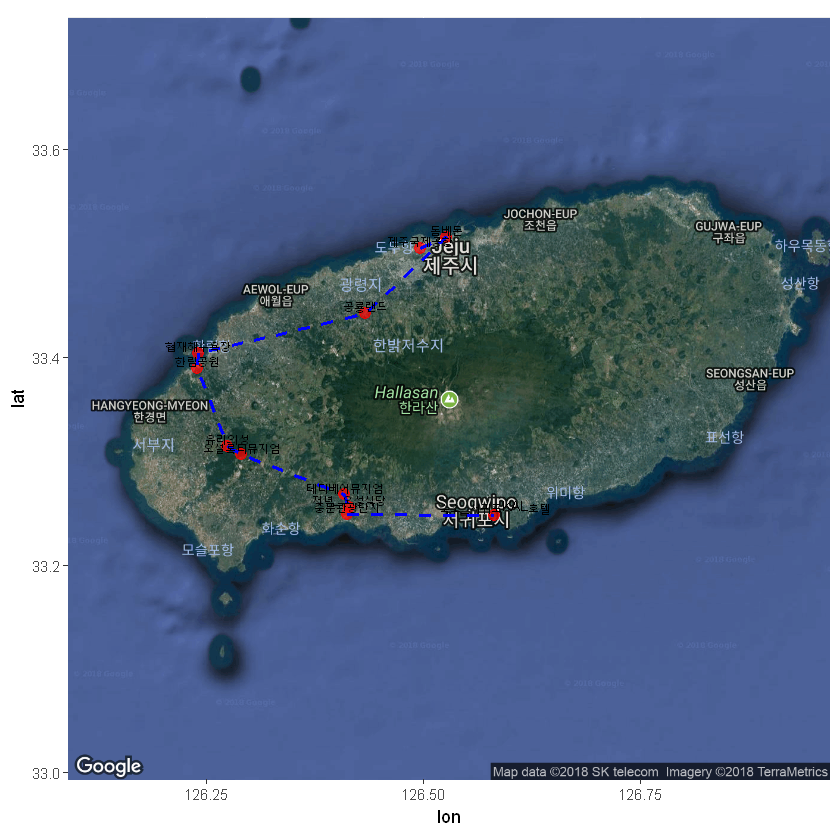

In [35]:
library(ggplot2)
library(ggmap)
jeju <- read.csv("제주도여행코스_1일차.csv",header=T)
head(jeju,5)
jeju1 <- get_map("Hallasan", zoom=10, maptype = "hybrid")
jeju.map <- ggmap(jeju1)+geom_point(data=jeju, 
            aes(x=LON, y=LAT),size=3,alpha=0.7,col="red")

# geom_path 함수를 써서 경로를 선으로 연결해서 표시합니다.
jeju.map + geom_path(data=jeju,aes(x=LON,y=LAT),size=1,linetype=2,col="blue")+
           geom_text(data=jeju, aes(x = LON, y = LAT+0.01, label=장소),size=3)

ggsave("jeju_1.png",dpi=700)

[1] 확진 확진 외래 외래 외래 외래 외래 외래 외래 확진 확진 확진 외래 외래 외래
[16] 외래 외래 외래 외래 외래 외래 외래 외래 외래 외래 외래 외래 외래
Levels: 외래 확진

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=muju&zoom=7&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=muju&sensor=false


ERROR: Error in savePlot("메르스병원.png", type = "png"): can only copy from 'windows' devices


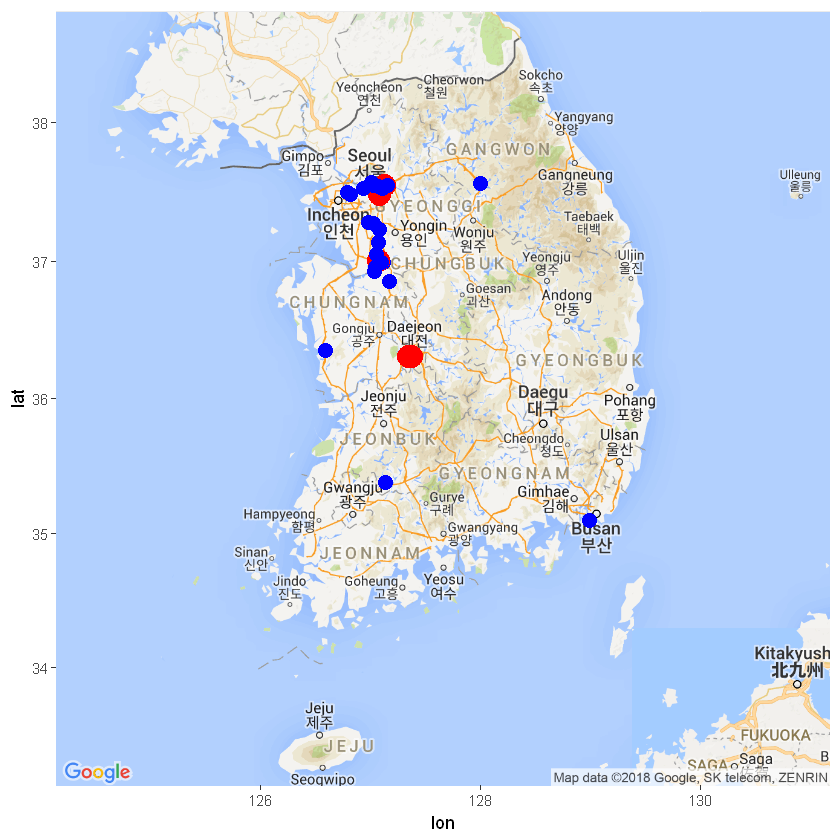

In [18]:
library(ggmap)
library(grid)
pop <- read.csv("메르스환자발병현황2.csv",header=T)
lon <- pop$LON
lat <- pop$LAT
name <- pop$병원명
gubun <- pop$구분

df <- data.frame(name,lon,lat,gubun)
loc2 <- df$gubun
loc2

colors <- c()
for ( i in 1:length(loc2)) {
 if (loc2[i] == '확진' ) {
     colors <- c(colors,"red") }
  else { 
    colors <- c(colors,"blue") }
 }

sizes <- c()
for ( i in 1:length(loc2)) {
 if (loc2[i] == '확진' ) {
     sizes <- c(sizes,6) }
  else { 
    sizes <- c(sizes,4) }
 }

map1 <- get_map("muju",zoom=7 , maptype='roadmap')
map1 <- ggmap(map1)
map2 <- map1 + geom_point(aes(x=lon,y=lat),colour=colors,size=sizes,alpha=1,data=df)
map2
savePlot("메르스병원.png",type="png")


### 점만 표시하는 것이 아닌 경로 연결해 주기

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=gangbukgu&zoom=13&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=gangbukgu&sensor=false


Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=gangbukgu&zoom=13&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=gangbukgu&sensor=false


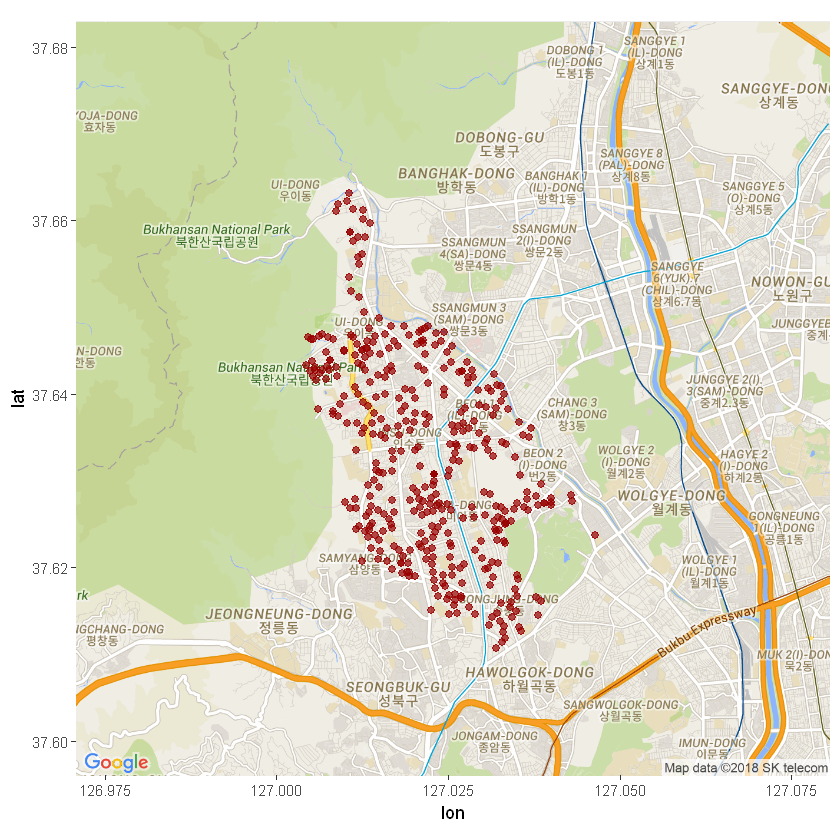

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=37.637412,127.02734&zoom=14&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Warning message:
"Removed 28 rows containing missing values (geom_point)."

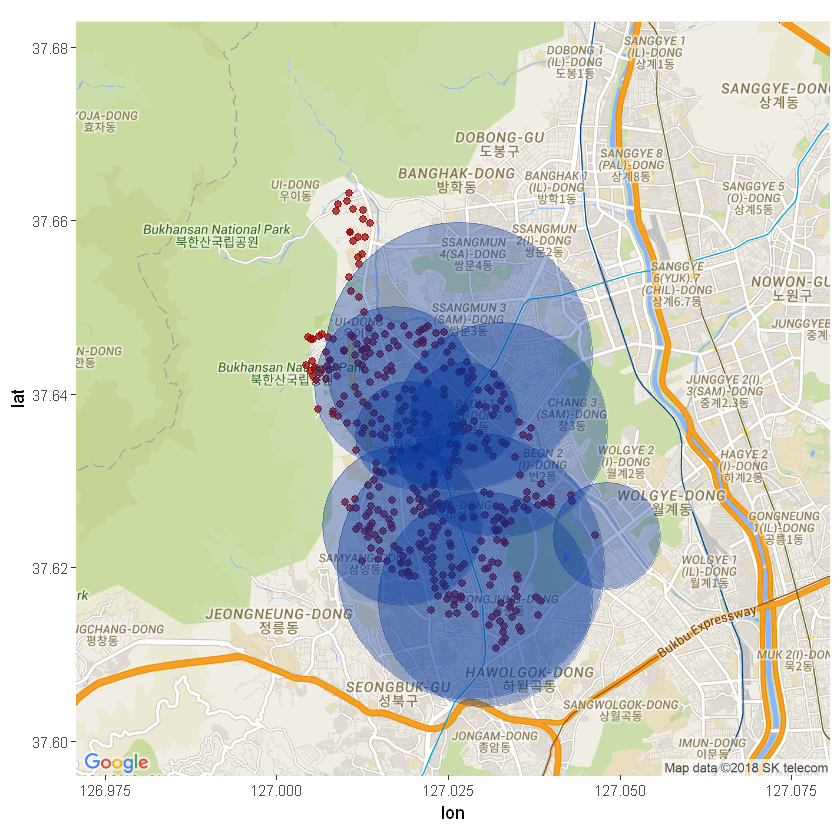

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=37.623605,127.048163&zoom=14&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Warning message:
"Removed 188 rows containing missing values (geom_point)."

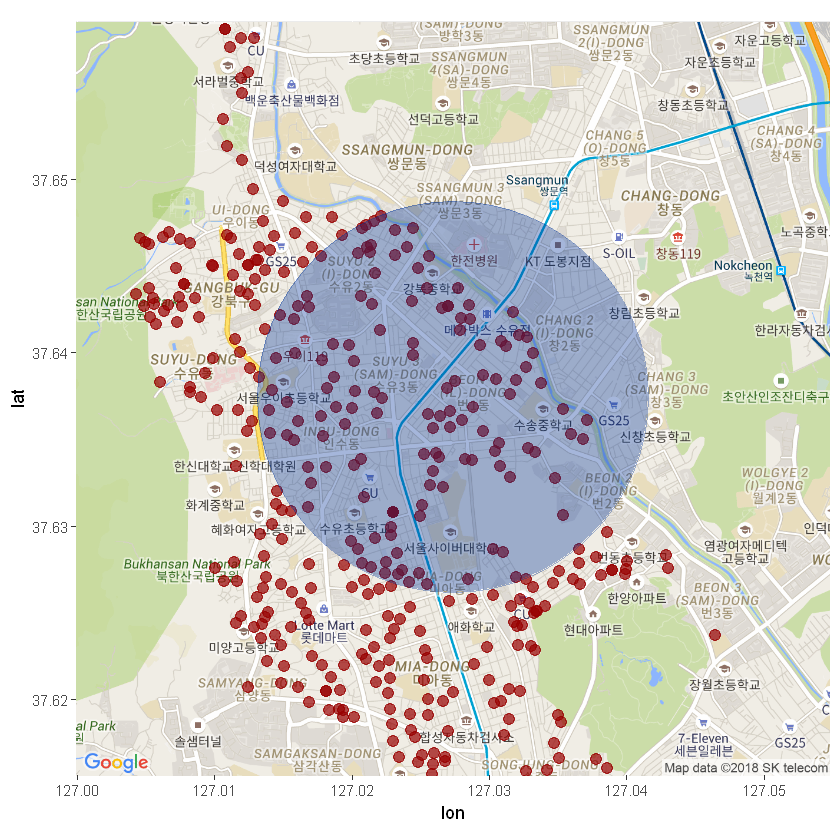

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=songpagu&zoom=13&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=songpagu&sensor=false
Warning message:
"Removed 2 rows containing missing values (geom_point)."

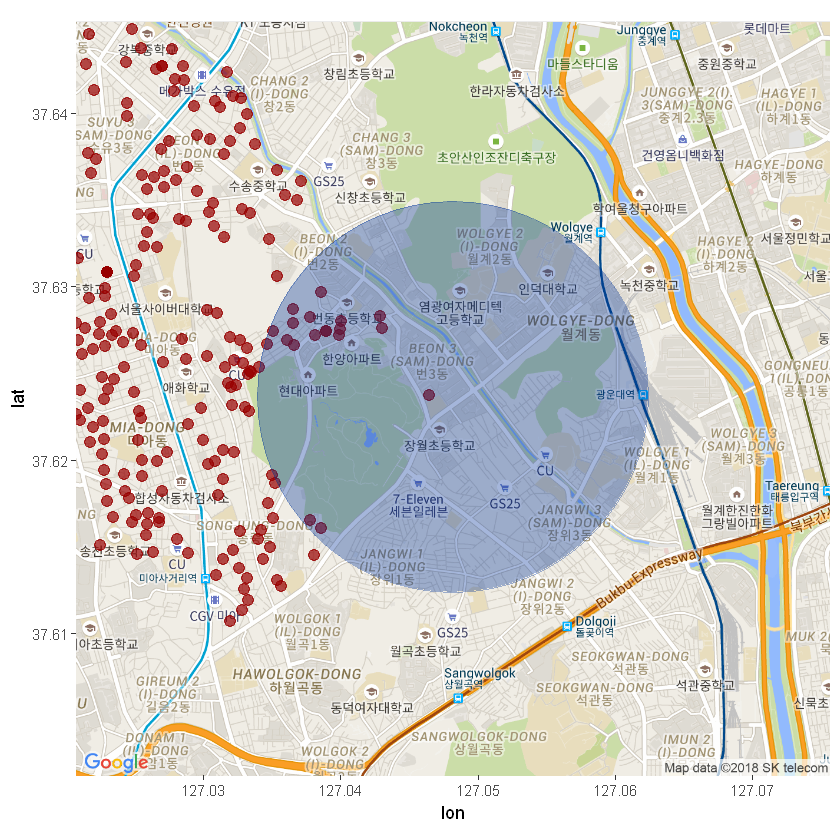

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=songpagu&zoom=13&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=songpagu&sensor=false
Warning message:
"geocode failed with status OVER_QUERY_LIMIT, location = "songpagu""

ERROR: Error in data.frame(ll.lat = ll[1], ll.lon = ll[2], ur.lat = ur[1], ur.lon = ur[2]): arguments imply differing number of rows: 0, 1


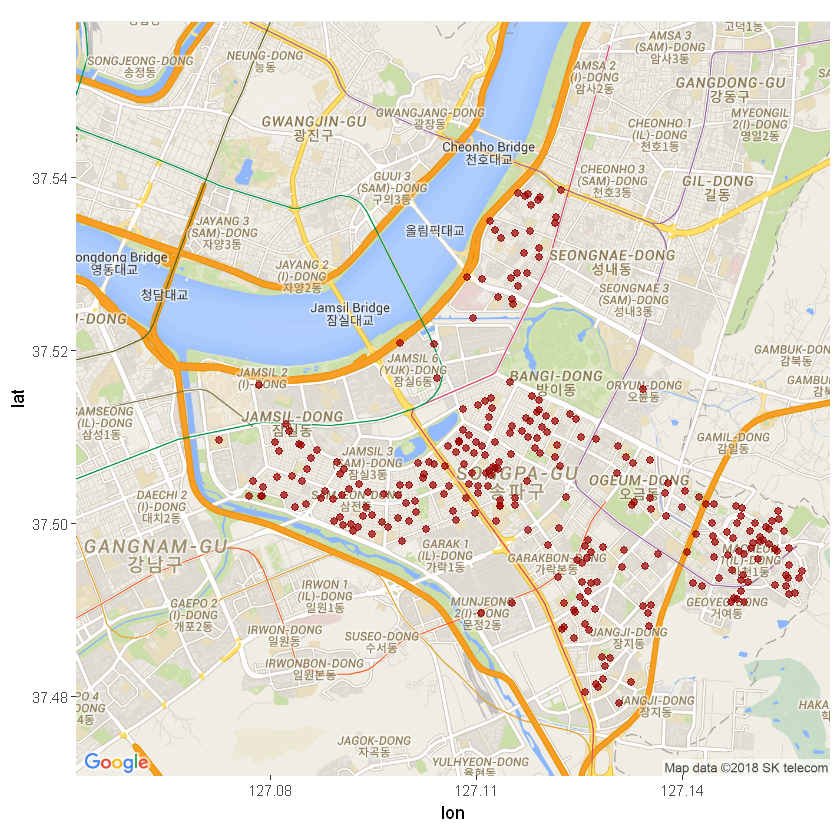

In [24]:
 library(ggmap)
 gangbuk <- read.csv("project_gangbuk_data.csv", header=T)
 g_m <- get_map("gangbukgu", zoom=13, maptype="roadmap")
 gang.map <- ggmap(g_m) + geom_point(data=gangbuk, aes(x=LON, y=LAT), size=2, 
              alpha=0.7, color="#980000")
 gang.map

#[ 강북구 CCTV 현황 + 관할 지구대 범위 ]
 g_m <- get_map("gangbukgu", zoom=13, maptype="roadmap")
 gang.map <- ggmap(g_m) + geom_point(data=gangbuk, aes(x=LON,y=LAT), size=2, alpha=0.7, color="#980000") +
 geom_point(aes(x=127.0273396, y=37.6374119), size=30, alpha=0.1, color="#003399") +
 geom_point(aes(x=127.0481630, y=37.6236052), size = 30,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.0192530, y=37.6353036), size = 30,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.0182250, y=37.6248237), size = 45,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.0170957, y=37.6409194), size = 45,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.0326000, y=37.6359904), size = 60,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.0303889, y=37.6163262), size = 60,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.0283051, y=37.6201638), size = 75,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.0266000, y=37.6443571), size = 75,alpha=0.1,color="#003399")
 gang.map

#[ 강북 경찰서 범위 소스 코드 ]
 g_m <- get_map(location=c(lon=127.0273396, lat=37.6374119), zoom=14, 
  maptype="roadmap")
 gang.map <- ggmap(g_m) + geom_point(data=gangbuk, aes(x=LON, y=LAT), size=3, 
 alpha=0.7, color="#980000") +
 geom_point(aes(x=127.0273396, y=37.6374119), size=110, alpha=0.1, color="#003399")
 gang.map

# [ 강북구 ? 번 3동 파출소 범위 ]
 g_m <- get_map(location=c(lon=127.0481630, lat=37.6236052), zoom=14, 
 maptype="roadmap")
 gang.map <- ggmap(g_m) + geom_point(data=gangbuk, aes(x=LON, y=LAT), size=3, alpha=0.7, color="#980000") +
 geom_point(aes(x=127.0481630, y=37.6236052), size=110, alpha=0.1, color="#003399")
 gang.map

#[ 송파구 소스 코드 ]
 songpa <- read.csv("project_songpa_data.csv", header=T)
 #송파구_전체 CCTV
 s_m <- get_map("songpagu", zoom=13, maptype="roadmap")
 song.map <- ggmap(s_m) + geom_point(data=songpa, aes(x=LON, y=LAT), size=2, alpha=0.7, color="#980000")
 song.map

# [ 송파구 CCTV 현황 + 경찰서 현황 ]
 s_m <- get_map("songpagu", zoom=13, maptype="roadmap")
 song.map <- ggmap(s_m) + geom_point(data=songpa, aes(x=LON, y=LAT), size=2, 
 alpha=0.7, color="#980000") +
 geom_point(aes(x=127.128335, y=37.5022377), size=30,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.112516, y=37.5201289), size=30,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.148227, y=37.496981), size=30,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.1465599, y=37.495096), size=30,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.1281358, y=37.506912), size=30,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.1167715, y=37.5287594), size=30,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.1296875, y=37.4852096), size=45,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.0928051, y=37.5027089), size=60,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.1252841, y=37.4982471), size=60,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.0821432, y=37.5120908), size=75,alpha=0.1,color="#003399") +
 geom_point(aes(x=127.1257587, y=37.5102538), size=75,alpha=0.1,color="#003399")
 song.map

# [ 송파 경찰서 소스 코드 ]
 #1.송파구_송파 경찰서
 s_m <- get_map(location=c(lon=127.128335, lat=37.5022377), zoom=14, 
 maptype="roadmap")
 song.map <- ggmap(s_m) + geom_point(data=songpa, aes(x=LON, y=LAT), size=3, 
 alpha=0.7, color="#980000") +
 geom_point(aes(x=127.128335, y=37.5022377), size=110, alpha=0.1, color="#003399")
 song.map

# [ 송파구 신천 파출소 현황 ]
 #2.송파구_신천 파출소
 s_m <- get_map(location=c(lon=127.112516, lat=37.5201289), zoom=14, 
 maptype="roadmap")
 song.map <- ggmap(s_m) + geom_point(data=songpa, aes(x=LON, y=LAT), size=3, 
 alpha=0.7, color="#980000") +
 geom_point(aes(x=127.112516, y=37.5201289), size=110, alpha=0.1, color="#003399")
 song.map